In [1]:
!pip install apyori  
## Installing apriori library

In [2]:
!pip install mlxtend

## Installing the Libraries

In [24]:
# Impoting Libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

## Importing the Dataset

In [21]:
# Loading Dataset
groceries_unpivot = pd.read_csv("groceries_unpivot.csv")

In [22]:
# Checking the dimensionality
groceries_unpivot.shape

(29063, 3)

In [27]:
# Analysing the first 5 rows
groceries_unpivot.head()

,PurchaseID,Date,Item,year
0,1,1/1/2000,laundry detergent,2000
1,1,1/1/2000,flour,2000
2,1,1/1/2000,butter,2000
3,1,1/1/2000,soap,2000
4,1,1/1/2000,aluminum foil,2000


In [47]:
# Analysing the last 5 rows
groceries_unpivot.tail()

,PurchaseID,Date,Item,year
29058,1499,2/26/2002,vegetables,2002
29059,1499,2/26/2002,vegetables,2002
29060,1499,2/26/2002,soda,2002
29061,1499,2/26/2002,shampoo,2002
29062,1499,2/26/2002,laundry detergent,2002


#### Selecting the transaction from year 2000 

In [26]:
# Extracting the year from the date column
data_col = pd.DatetimeIndex(groceries_unpivot["Date"])
#groceries_unpivot['day'] = data_col.day
#groceries_unpivot['month'] = data_col.month
groceries_unpivot['year'] = data_col.year

In [ ]:
# Viewing the first 5 rows
groceries_unpivot.head()

In [11]:
# Exploring the unique values in the year column
groceries_unpivot["year"].unique()

array([2000, 2001, 2002], dtype=int64)

##### Creating a dataframe for the containing entries for the year 2000

In [12]:
# Creating a dataframe for the containing entries for the year 2000
groceries_unpivot_2000 = groceries_unpivot[groceries_unpivot["year"]==2000]

In [13]:
# Checking the dimensionality
groceries_unpivot_2000.shape

(13492, 6)

In [14]:
# Reviewing the dataset statistics
groceries_unpivot_2000.describe()

,PurchaseID,day,month,year
count,13492.000000,13492.000000,13492.000000,13492.0
mean,353.870886,15.261933,6.478209,2000.0
std,204.549993,8.935518,3.433632,0.0
min,1.000000,1.000000,1.000000,2000.0
25%,176.000000,7.000000,4.000000,2000.0
50%,358.500000,15.000000,7.000000,2000.0
75%,528.000000,22.000000,9.000000,2000.0
max,708.000000,31.000000,12.000000,2000.0


In [15]:
# Exploring the missing values in the dataset
groceries_unpivot.isnull().sum()

PurchaseID    0
Date          0
Item          0
day           0
month         0
year          0
dtype: int64

In [29]:
# Checking the datatypes in the dataset
groceries_unpivot_2000.dtypes

PurchaseID     int64
Date          object
Item          object
day            int64
month          int64
year           int64
dtype: object

## Cleaning the data

In [44]:
# Remove spaces from the beginning and end
groceries_unpivot_2000.Item= groceries_unpivot_2000.Item.str.strip()

In [45]:
#Drop rows without PurchaseID
groceries_unpivot_2000.dropna(axis=0, subset=['PurchaseID'], inplace=True)
groceries_unpivot_2000['PurchaseID'] = groceries_unpivot_2000['PurchaseID'].astype('str')

In [31]:
groceries_unpivot_2000_items = groceries_unpivot_2000.groupby(['Item']).size()
groceries_unpivot_2000_items = pd.Series.to_frame(groceries_unpivot_2000_items,name = 'No. of items')
groceries_unpivot_2000_items.sort_values(by = "No. of items", inplace = True, ascending = False)
groceries_unpivot_2000_items

,No. of items
Item,
vegetables,969
poultry,376
lunch meat,370
shampoo,360
cereals,358
pasta,355
waffles,355
flour,354
mixes,353


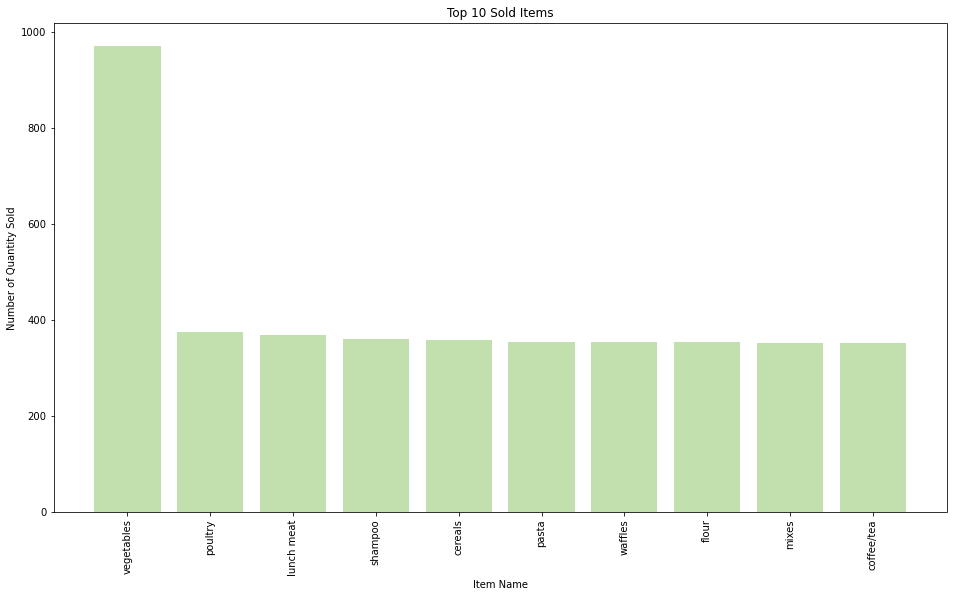

In [33]:
Item_distr = groceries_unpivot_2000.groupby("Item").size().reset_index(name='Frequency').sort_values(by = 'Frequency',ascending=False).head(10)

## Declaring variables

bars = Item_distr["Item"]
height = Item_distr["Frequency"]
x_pos = np.arange(len(bars))

## Defining Figure Size

plt.figure(figsize=(16,9))

# Create bars
plt.bar(x_pos, height, color=(0.4, 0.7, 0.2, 0.4))

# Add title and axis names
plt.title("Top 10 Sold Items")
plt.xlabel("Item Name")
plt.ylabel("Number of Quantity Sold")

# Create names on the x-axis
plt.xticks(x_pos, bars,rotation='vertical')

# Show graph
plt.show()

In [34]:
groceries_unpivot_2000_set = groceries_unpivot_2000[["PurchaseID", "Item"]].sort_values(by = "PurchaseID", ascending = False) ## Selecting only required variables for modelling
groceries_unpivot_2000_set

,PurchaseID,Item
13491,708,pork
13481,708,cheeses
13472,708,ketchup
13473,708,hand soap
13474,708,spaghetti sauce
...,...,...
16,1,ice cream
17,1,vegetables
18,1,soda
19,1,dinner rolls


## Creating basket

In [35]:
transactions = groceries_unpivot_2000_set.groupby(['PurchaseID','Item'])['Item'].count().unstack().reset_index().fillna(0).set_index('PurchaseID')

In [36]:
transactions

Item,all- purpose,aluminum foil,bagels,beef,butter,cereals,cheeses,coffee/tea,dinner rolls,dishwashing liquid/detergent,...,shampoo,soap,soda,spaghetti sauce,sugar,toilet paper,tortillas,vegetables,waffles,yogurt
PurchaseID,,,,,,,,,,,,,,,,,,,,,
1,3.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,2.0,0.0,...,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
2,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,2.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0,2.0,1.0
3,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,...,1.0,2.0,1.0,3.0,0.0,2.0,0.0,4.0,0.0,0.0
4,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
5,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,1.0,0.0,1.0,1.0,7.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
704,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
705,1.0,2.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,1.0,1.0,0.0,0.0,3.0,0.0,0.0
706,0.0,1.0,0.0,1.0,3.0,0.0,0.0,1.0,2.0,2.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0


## Encoding

In [37]:

#converting all positive values to 1 and everything else to 0
def my_encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

transaction_sets = transactions.applymap(my_encode_units)


In [38]:
transaction_sets.shape

(708, 38)

## Generate frequent itemsets

In [39]:

frequent_itemsets = apriori(transaction_sets, min_support = 0.07, use_colnames=True) 
#frequent_itemsets = frequent_itemsets.sort_values(by = 'support', ascending = False)
frequent_itemsets


C:\Users\Dell\anaconda3\lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:111: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.371469,(all- purpose)
1,0.367232,(aluminum foil)
2,0.377119,(bagels)
3,0.381356,(beef)
4,0.371469,(butter)
...,...,...
3913,0.070621,"(paper towels, pasta, vegetables, poultry)"
3914,0.072034,"(soda, spaghetti sauce, vegetables, pasta)"
3915,0.072034,"(soda, waffles, vegetables, pasta)"
3916,0.073446,"(sugar, toilet paper, vegetables, poultry)"


## Generating association rules

In [40]:
pd.set_option('display.max_rows', None)

rules = association_rules(frequent_itemsets, metric = 'lift', min_threshold = 1)
#rules.sort_values(by='lift', ascending = False).head(10)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,(aluminum foil),(all- purpose),0.367232,0.371469,0.151130,0.411538,1.107868,0.014715,1.068092
1,(all- purpose),(aluminum foil),0.371469,0.367232,0.151130,0.406844,1.107868,0.014715,1.066783
2,(bagels),(all- purpose),0.377119,0.371469,0.149718,0.397004,1.068740,0.009630,1.042347
3,(all- purpose),(bagels),0.371469,0.377119,0.149718,0.403042,1.068740,0.009630,1.043425
4,(beef),(all- purpose),0.381356,0.371469,0.145480,0.381481,1.026954,0.003818,1.016188
5,(all- purpose),(beef),0.371469,0.381356,0.145480,0.391635,1.026954,0.003818,1.016896
6,(cheeses),(all- purpose),0.374294,0.371469,0.141243,0.377358,1.015855,0.002204,1.009459
7,(all- purpose),(cheeses),0.371469,0.374294,0.141243,0.380228,1.015855,0.002204,1.009575
8,(coffee/tea),(all- purpose),0.378531,0.371469,0.158192,0.417910,1.125021,0.017580,1.079784
9,(all- purpose),(coffee/tea),0.371469,0.378531,0.158192,0.425856,1.125021,0.017580,1.082426


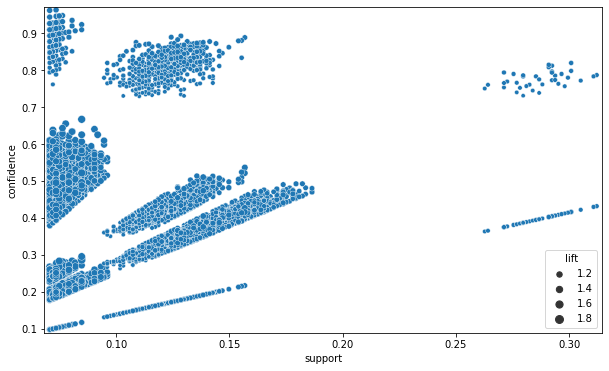

In [46]:
# Generate scatterplot using support and confidence
plt.figure(figsize=(10,6))
sns.scatterplot(x = "support", y = "confidence", 
                size = "lift", data = rules)
plt.margins(0.01,0.01)
plt.show()

In [42]:
len(rules)

21800

In [33]:
transaction_sets['beef'].sum()

270

## Filtering rules with high Confidence and Lift

In [ ]:
#Filtering rules based on condition
rules[ (rules['lift'] >= 1) &
       (rules['confidence'] >= 0.3) ]